In [9]:
# !pip install captum 
import torch
import torchvision.transforms as T
from torchcam.methods import GradCAM
import segmentation_models_pytorch as smp
import matplotlib.pyplot as plt
import cv2
import numpy as np 
from PIL import Image

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

num_classes = 7
model = smp.Unet(encoder_name="resnet34", encoder_weights=None, in_channels=3, classes=num_classes)

checkpoint = torch.load("/home/pnaray2s/workspace/Learnings/Xai/sss/my_checkpoints/H1_Experiments/data_processed_citypark_25m_H1_Experiments_citypark_synthetic_25m_pretrained_unet_unet_miou0.5013_epoch60_best.pth", map_location=device)
model.load_state_dict(checkpoint['model_state_dict'] if 'model_state_dict' in checkpoint else checkpoint)

class_names = checkpoint.get("class_names", None)
    
model.to(device)
model.eval()

Unet(
  (encoder): ResNetEncoder(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track

In [16]:
# !pip install zennit


In [10]:
# image_path = "/home/pnaray2s/workspace/Learnings/Xai/sss/datasets/final/citypark/data_processed_citypark_25m/test/Images/scene_2014.jpeg"

# image_path ="/home/pnaray2s/workspace/Learnings/Xai/sss/datasets/final/data_uavid/test/seq21/Images/000900.png"

# output = model(image_path.unsqueeze(0))  # [1, C, H, W]
# target_class = 3  # e.g., 'car'
# target_pixel = (128, 256)

# # Initialize relevance map same shape as output
# R = torch.zeros_like(output)
# R[0, target_class, target_pixel[0], target_pixel[1]] = output[0, target_class, target_pixel[0], target_pixel[1]]


image_path ="/home/pnaray2s/workspace/Learnings/Xai/sss/datasets/final/data_uavid/test/seq21/Images/000900.png"
transform = T.Compose([T.Resize((512, 512)),T.ToTensor(), T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])])

original = cv2.imread(image_path)
original = cv2.cvtColor(original, cv2.COLOR_BGR2RGB)
pil_image = Image.fromarray(original)

x = transform(pil_image).unsqueeze(0).to(device)

In [24]:
from zennit.image import imsave
composite = EpsilonPlusFlat()
with composite.context(model) as modified_model:
    output = modified_model(x)
    target_class = output.argmax(dim=1).unsqueeze(1)
    
    # Backpropagate relevance
    relevance = torch.autograd.grad((output * (target_class == output.argmax(dim=1, keepdim=True))).sum(), x)[0]

# --- 4. Visualize ---
relevance_map = relevance.squeeze().sum(0).detach().cpu().numpy()
imsave("lrp_result.png", relevance_map)

/tmp/ipykernel_176285/3239729633.py:16: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  ckpt = torch.load(model_path, map_location=device)


Detected 7 classes in model output.
Classes present in this image: [0, 1, 2, 3, 4, 5, 6]


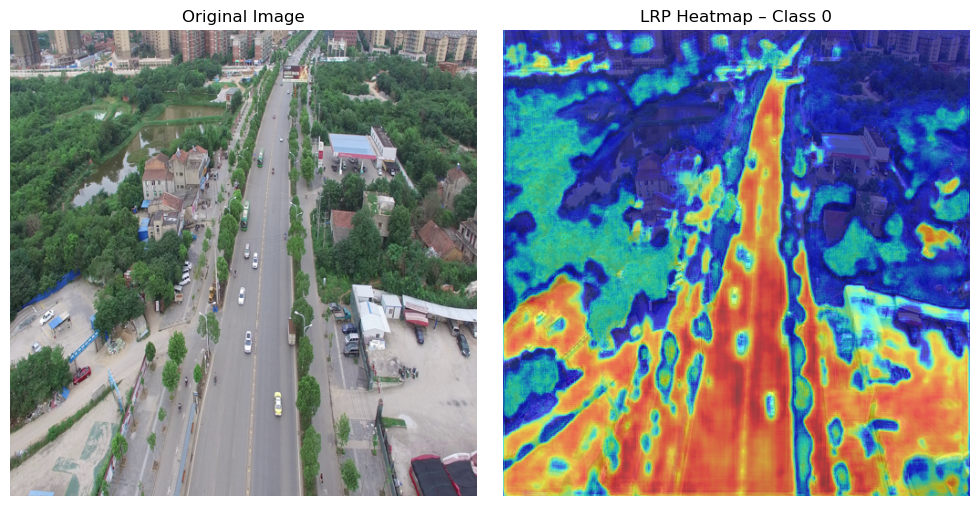

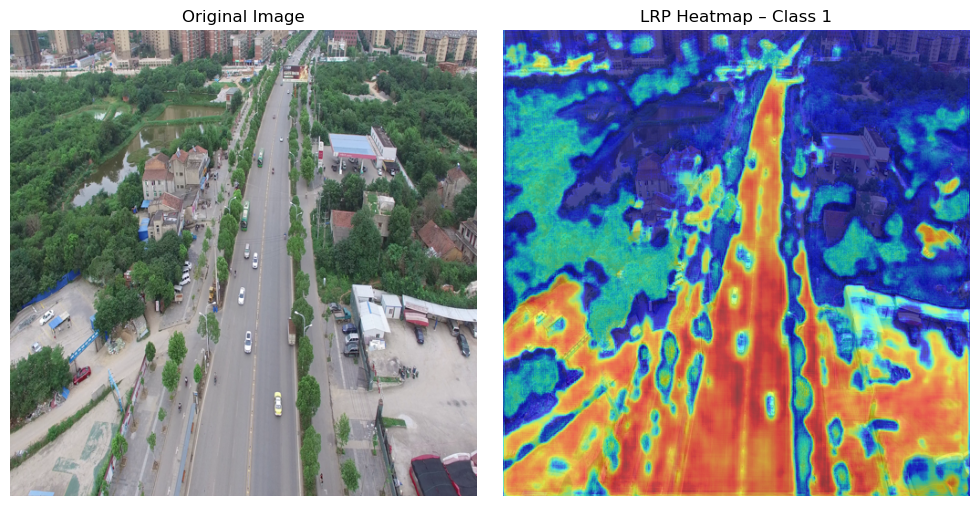

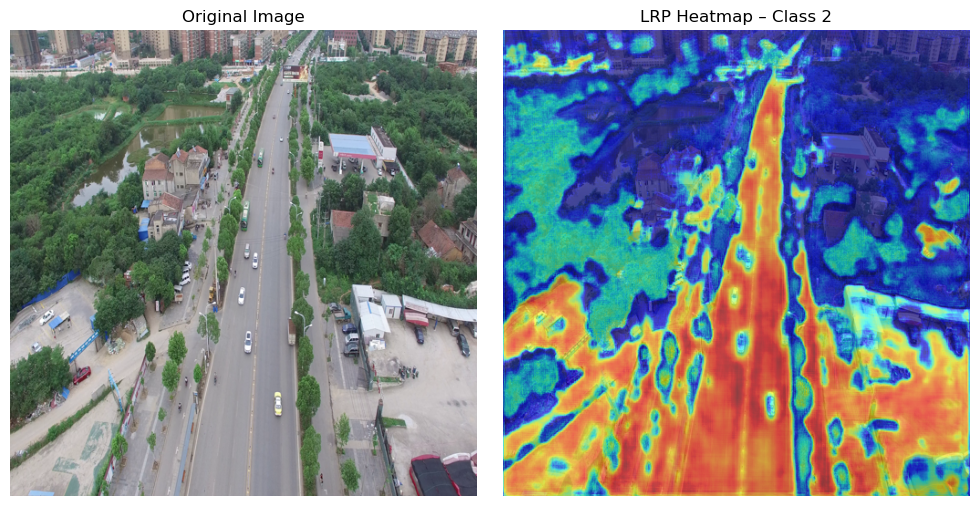

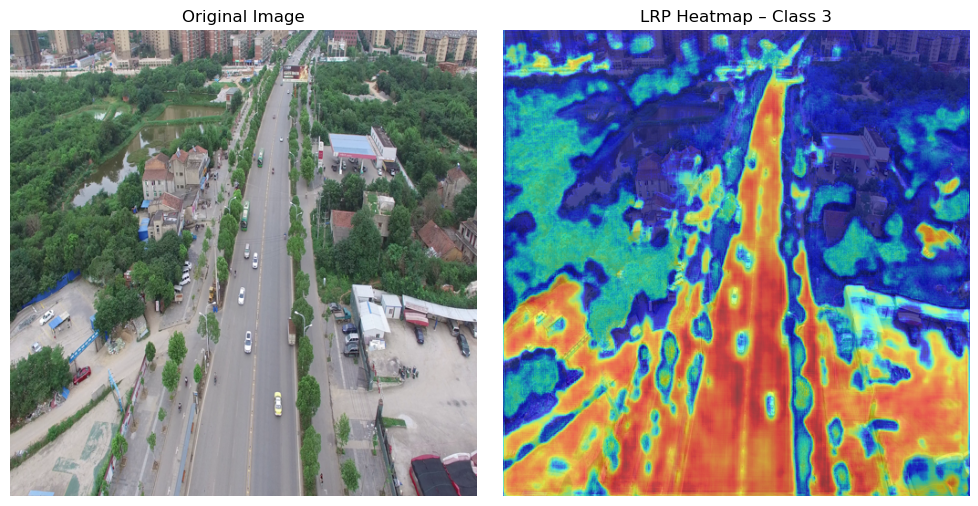

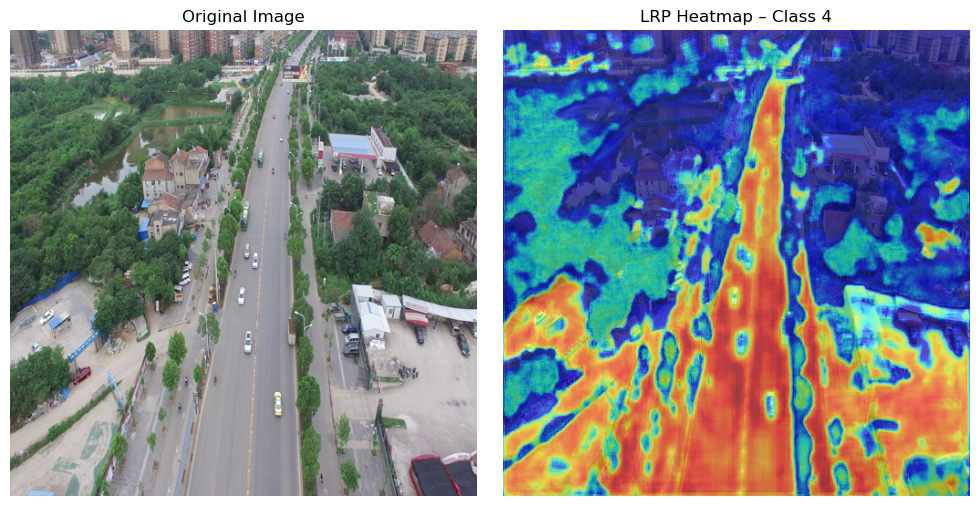

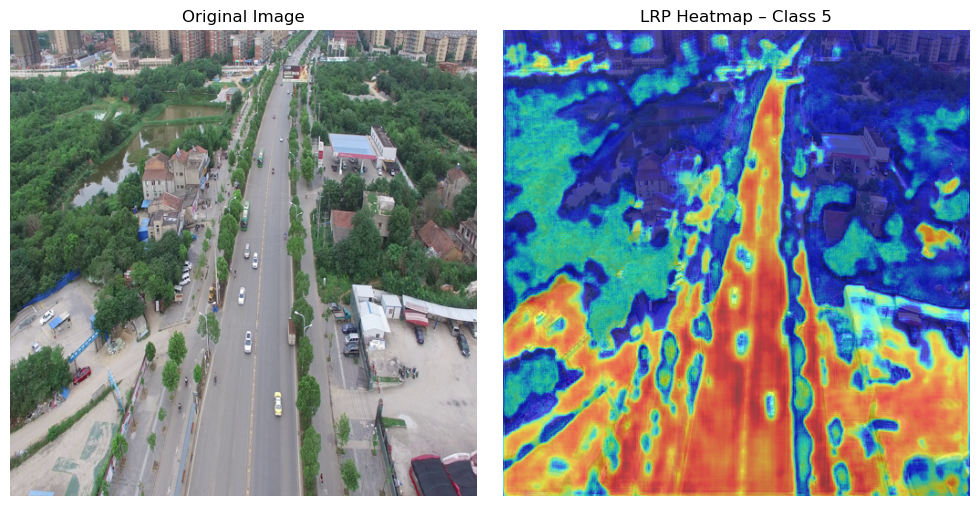

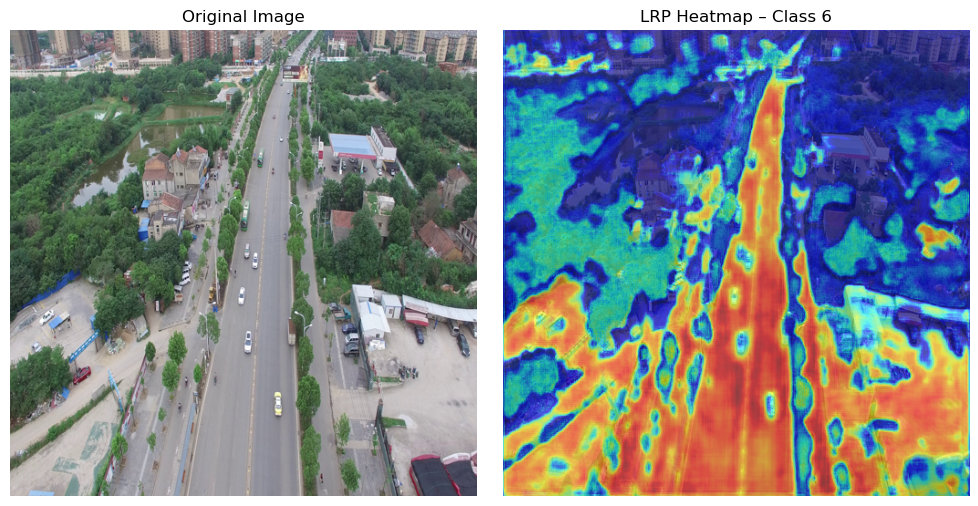

In [9]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import segmentation_models_pytorch as smp
from torchvision import transforms
from zennit.attribution import Gradient
from zennit.composites import EpsilonPlusFlat

# ---- Setup ----
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# ---- Load model ----
model = smp.Unet(encoder_name="resnet34", encoder_weights=None, in_channels=3, classes=7)
model_path = "/home/pnaray2s/workspace/Learnings/Xai/sss/my_checkpoints/H1_Experiments/data_processed_citypark_25m_H1_Experiments_citypark_synthetic_25m_pretrained_unet_unet_miou0.5013_epoch60_best.pth"
ckpt = torch.load(model_path, map_location=device)
model.load_state_dict(ckpt['model_state_dict'] if 'model_state_dict' in ckpt else ckpt)
model.to(device).eval()

# ---- Load image ----
img_path ="/home/pnaray2s/workspace/Learnings/Xai/sss/datasets/final/data_uavid/test/seq21/Images/000900.png"

img = Image.open(img_path).convert("RGB")
transform = transforms.Compose([
    transforms.Resize((512, 512)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485,0.456,0.406],
                         std=[0.229,0.224,0.225]),
])
x = transform(img).unsqueeze(0).to(device)
img_np = np.array(img.resize((512,512))) / 255.0

# ---- Prediction ----
with torch.no_grad():
    output = model(x)  # (1, C, H, W)
pred = torch.argmax(output, dim=1).squeeze().cpu().numpy()

num_classes = output.shape[1]
print(f"Detected {num_classes} classes in model output.")

# ---- LRP setup ----
composite = EpsilonPlusFlat()
attr = Gradient(model, composite=composite)

# ---- Compute relevance for each detected class ----
present_classes = np.unique(pred)
print(f"Classes present in this image: {present_classes.tolist()}")

relevances = {}
for cls_idx in present_classes:
    # Mask only the predicted pixels for this class
    mask = (pred == cls_idx)
    if not mask.any():
        continue

    # convert mask to torch
    mask_t = torch.tensor(mask, device=device).float().unsqueeze(0).unsqueeze(0)  # (1,1,H,W)

    # build a grad_output mask of shape (1, C, H, W)
    grad_mask = torch.zeros_like(output)
    grad_mask[:, cls_idx, :, :] = mask_t
    # create target focusing only on those pixels
    # target = (output * mask_t).sum()  # scalar sum of relevant logits

    relevance, _ = attr(x, grad_mask)
    rel_map = relevance.detach().cpu().numpy().squeeze().sum(0)
    rel_map = np.maximum(rel_map, 0)
    rel_map /= rel_map.max() + 1e-8

    relevances[int(cls_idx)] = rel_map

# ---- Visualization ----
for cls_idx, rel_map in relevances.items():
    fig, axs = plt.subplots(1, 2, figsize=(10, 5))
    axs[0].imshow(img_np)
    axs[0].set_title(f"Original Image")
    axs[0].axis('off')

    axs[1].imshow(img_np)
    axs[1].imshow(rel_map, cmap='jet', alpha=0.6)
    axs[1].set_title(f"LRP Heatmap - Class {cls_idx}")
    axs[1].axis('off')

    plt.tight_layout()
    plt.show()


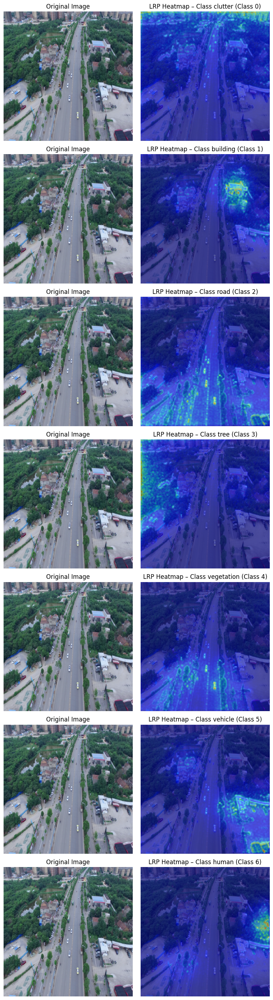

In [14]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from zennit.composites import EpsilonPlusFlat

# ---- composite context ----

class_names = ckpt.get("class_names", None)

x.requires_grad_(True)

composite = EpsilonPlusFlat()

with composite.context(model) as modified_model:
    output = modified_model(x)  # (1, C, H, W)
    num_classes = output.shape[1]

    relevances = []
    for cls_idx in range(num_classes):
        # mask: only pixels predicted as this class
        mask = (output.argmax(dim=1, keepdim=True) == cls_idx).float()
        relevance = torch.autograd.grad((output * mask).sum(), x, retain_graph=True)[0]
        rel_map = relevance.detach().cpu().numpy().squeeze().sum(0)
        rel_map = np.maximum(rel_map, 0)
        rel_map /= rel_map.max() + 1e-8
        relevances.append(rel_map)

# ---- Visualization ----
img_np = x.detach().cpu().squeeze().permute(1, 2, 0).numpy()
img_np = (img_np - img_np.min()) / (img_np.max() - img_np.min())

fig, axs = plt.subplots(num_classes, 2, figsize=(8, 4 * num_classes))
pred_classes = output.argmax(dim=1).unique().cpu().numpy()

for cls_idx, rel_map in enumerate(relevances):
    axs[cls_idx, 0].imshow(img_np)
    axs[cls_idx, 0].set_title("Original Image")
    axs[cls_idx, 0].axis("off")

    axs[cls_idx, 1].imshow(img_np)
    axs[cls_idx, 1].imshow(rel_map, cmap="jet", alpha=0.6)
    axs[cls_idx, 1].set_title(f"LRP Heatmap - Class {class_names[cls_idx]} (Class {cls_idx})")
    axs[cls_idx, 1].axis("off")

plt.tight_layout()
plt.show()


In [2]:
!pip show zennit

Name: zennit
Version: 1.0.0
Summary: Attribution of Neural Networks using PyTorch
Home-page: 
Author: 
Author-email: "Christopher J. Anders" <contact@cjanders.de>, Sebastian Lapuschkin <sebastian.lapuschkin@hhi.fraunhofer.de>, Pattarawat Chormai <pat.chormai@gmail.com>
License-Expression: GPL-3.0-or-later AND LGPL-3.0-or-later
Location: /home/pnaray2s/miniconda3/envs/zennit11/lib/python3.11/site-packages
Requires: click, numpy, pillow, torch, torchvision
Required-by: 


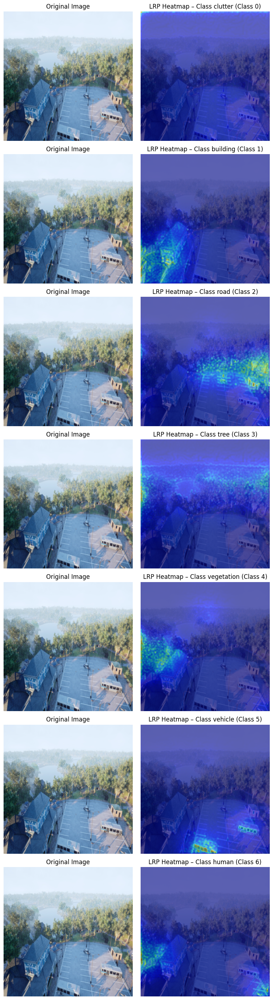

In [19]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from zennit.composites import EpsilonPlusFlat

import torch
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import segmentation_models_pytorch as smp
from torchvision import transforms
from zennit.attribution import Gradient
from zennit.composites import EpsilonPlusFlat

# ---- Setup ----
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# ---- Load model ----
model = smp.Unet(encoder_name="resnet34", encoder_weights=None, in_channels=3, classes=7)
model_path = "/home/pnaray2s/workspace/Learnings/Xai/sss/my_checkpoints/H1_Experiments/data_processed_citypark_25m_H1_Experiments_citypark_synthetic_25m_pretrained_unet_unet_miou0.5013_epoch60_best.pth"
ckpt = torch.load(model_path, map_location=device)
model.load_state_dict(ckpt['model_state_dict'] if 'model_state_dict' in ckpt else ckpt)
model.to(device).eval()

# ---- Load image ----
# img_path ="/home/pnaray2s/workspace/Learnings/Xai/sss/datasets/final/data_uavid/test/seq21/Images/000900.png"
img_path = "/home/pnaray2s/workspace/Learnings/Xai/sss/datasets/final/citypark/data_processed_citypark_25m/test/Images/scene_2015.jpeg"
img = Image.open(img_path).convert("RGB")
transform = transforms.Compose([
    transforms.Resize((512, 512)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485,0.456,0.406],
                         std=[0.229,0.224,0.225]),
])
x = transform(img).unsqueeze(0).to(device)
img_np = np.array(img.resize((512,512))) / 255.0

class_names = ckpt.get("class_names", None)

x.requires_grad_(True)

composite = EpsilonPlusFlat()

with composite.context(model) as modified_model:
    output = modified_model(x)  # (1, C, H, W)
    num_classes = output.shape[1]

    relevances = []
    for cls_idx in range(num_classes):
        # mask: only pixels predicted as this class
        mask = (output.argmax(dim=1, keepdim=True) == cls_idx).float()
        relevance = torch.autograd.grad((output * mask).sum(), x, retain_graph=True)[0]
        rel_map = relevance.detach().cpu().numpy().squeeze().sum(0)
        rel_map = np.maximum(rel_map, 0)
        rel_map /= rel_map.max() + 1e-8
        relevances.append(rel_map)

img_np = x.detach().cpu().squeeze().permute(1, 2, 0).numpy()
img_np = (img_np - img_np.min()) / (img_np.max() - img_np.min())

fig, axs = plt.subplots(num_classes, 2, figsize=(8, 4 * num_classes))
pred_classes = output.argmax(dim=1).unique().cpu().numpy()

for cls_idx, rel_map in enumerate(relevances):
    axs[cls_idx, 0].imshow(img_np)
    axs[cls_idx, 0].set_title("Original Image")
    axs[cls_idx, 0].axis("off")

    axs[cls_idx, 1].imshow(img_np)
    axs[cls_idx, 1].imshow(rel_map, cmap="jet", alpha=0.6)
    axs[cls_idx, 1].set_title(f"LRP Heatmap - Class {class_names[cls_idx]} (Class {cls_idx})")
    axs[cls_idx, 1].axis("off")

plt.tight_layout()
plt.show()
